In [1]:
import jax
print(jax.devices())

[CpuDevice(id=0)]


In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
import scanpy as sc
import scarches as sca
from scarches.dataset.trvae.data_handling import remove_sparsity
import traceback
import os
import anndata as ad

 captum (see https://github.com/pytorch/captum).


In [4]:
os.chdir('/ictstr01/groups/ml01/workspace/shrey.parikh/PDAC_Work_Dir/PDAC_Final')

In [5]:
import numpy as np
from scipy.sparse import issparse
import logging

def bin_data(adata, binning, key_to_process = None, result_binned_key="binned_data"):
    """
    Bins numerical data into discrete categories based on quantiles.

    Parameters:
        adata (AnnData): The input data object.
        key_to_process (str): Key in `adata.layers` to process.
        binning (int): Number of bins (must be an integer).
        result_binned_key (str): Key to store the binned results.

    Raises:
        ValueError: If `binning` is not an integer or data contains negative values.
    """
    if not isinstance(binning, int):
        raise ValueError(f"Binning must be an integer, but got {binning}.")

    layer_data = adata.layers[key_to_process] if key_to_process is not None else adata.X
    layer_data = layer_data.toarray() if issparse(layer_data) else layer_data  # Convert sparse to dense if needed

    if layer_data.min() < 0:
        raise ValueError(f"Expecting non-negative data, but got min value {layer_data.min()}.")

    binned_rows = []
    bin_edges = []

    for row in layer_data:
        if row.max() == 0:
            logger.warning("Row contains all zeros. Consider filtering such rows.")
            binned_rows.append(np.zeros_like(row, dtype=np.int64))
            bin_edges.append(np.array([0] * binning))
            continue

        non_zero_ids = row.nonzero()
        non_zero_row = row[non_zero_ids]

        # Define bin thresholds based on quantiles
        bins = np.quantile(non_zero_row, np.linspace(0, 1, binning - 1))

        # Assign bin indices
        non_zero_digits = np.digitize(non_zero_row, bins)  # Converts values into bin indices
        binned_row = np.zeros_like(row, dtype=np.int64)
        binned_row[non_zero_ids] = non_zero_digits

        binned_rows.append(binned_row)
        bin_edges.append(np.concatenate([[0], bins]))

    # Store the binned data and bin edges
    adata.layers[result_binned_key] = np.stack(binned_rows)
    adata.obsm["bin_edges"] = np.stack(bin_edges)

In [6]:
def train_scanvi_add_embedding(
    adata,
    batch_key='ID_batch_covariate',
    cell_type_key='Level_4',
    n_latent=10,
    n_layers=2,
    max_epochs_vae=150,
    max_epochs_scanvae=80,
    ref_path='scanvae/scanvae_model',
    full_adata_path='scanvae/scanvae_adata_with_embedding.h5ad'
):
    """
    Train scANVI model and add latent representation to the input AnnData object.

    Parameters:
        adata (AnnData): Annotated data matrix with labels for supervised training.
        batch_key (str): Key for batch information in adata.obs.
        cell_type_key (str): Key for cell type labels in adata.obs.
        n_latent (int): Number of latent dimensions for scANVI.
        n_layers (int): Number of layers for the scANVI model.
        max_epochs_vae (int): Epochs for pretraining the scVI model.
        max_epochs_scanvae (int): Epochs for training the scANVI model.
        ref_path (str): Path to save the scANVI model.
        full_adata_path (str): Path to save the updated AnnData object.

    Returns:
        adata (AnnData): Updated AnnData object with latent representation in `.obsm`.
        scanvae_model (SCANVI): Trained scANVI model.
    """
    try:
        print("Setting up scVI/scANVI model...")
        # Remove sparsity for compatibility
        adata = remove_sparsity(adata.copy())        
        sca.models.SCVI.setup_anndata(adata, batch_key=batch_key, labels_key=cell_type_key)
        print("Training scVI model...")
        vae = sca.models.SCVI(
            adata,
            n_layers=n_layers,
            n_latent=n_latent,
            encode_covariates=True,
            deeply_inject_covariates=False,
            use_layer_norm="both",
            use_batch_norm="none"
        )
        vae.train(max_epochs=max_epochs_vae)

        print("Initializing and training scANVI model...")
        scanvae = sca.models.SCANVI.from_scvi_model(vae, unlabeled_category="Unknown")
        scanvae.train(max_epochs=max_epochs_scanvae)
        scanvae.save(ref_path, overwrite=True)

        print("Adding latent representation to AnnData...")
        adata.obsm['scanvi_L4_emb'] = scanvae.get_latent_representation(adata=adata)

        print("Performing clustering and UMAP visualization...")
        sc.pp.neighbors(adata, use_rep='scanvi_L4_emb', n_neighbors=100,  metric='cosine')
        sc.tl.leiden(adata, resolution=0.5, key_added='Global_Leiden')
        sc.tl.umap(adata, min_dist=0.75)
        #prepare for metrics
        adata.uns['output_type'] = 'embed'
        adata.obsm['X_emb'] = adata.obsm['scanvi_L4_emb']
        adata.obsm['X_umap_scanvi'] = adata.obsm['X_umap']
        # Save updated AnnData object
        adata.write(full_adata_path)
        print("scANVI training and embedding generation completed successfully.")
        return adata, scanvae

    except Exception as e:
        print(f"scANVI training failed: {e}")
        traceback.print_exc()
        return None, None

In [7]:
adata = sc.read_h5ad('Downstream/final_scanVI/final_object_mg.h5ad')

In [8]:
adata.X = adata.layers['raw'].copy()

In [9]:
adata.obs.drop(['_scvi_batch','_scvi_labels'], inplace=True, axis=1)

In [10]:
adata.obs.head()

,Barcode,Dataset,ID_batch_covariate,Unique_ID,Technology,n_genes,n_counts,log_counts,mt_frac,n_genes_by_counts,...,Condition,combo,EMT category,EMT score,EMT_score_DL,Suspicious_Normal,Level_1,Level_2,Level_3,Level_4
Dataset_Barcode,,,,,,,,,,,,,,,,,,,,,
Ding_AAACCCAAGTCATCGT-1-HT056P-S1PAA1-0-0-0-0,AAACCCAAGTCATCGT-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,2929,12375.0,9.423433,0.096727,2929,...,PDAC,Myeloid_Dendritic Cell_cDC2,NaN,NaN,NaN,Other,Immune Cell,Myeloid,Dendritic Cell,Dendritic Cell - cDC2
Ding_AAACCCACAACCACGC-1-HT056P-S1PAA1-0-0-0-0,AAACCCACAACCACGC-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,3440,10981.0,9.303922,0.068573,3440,...,PDAC,Fibroblast_Fibroblast_Fibroblast,NaN,NaN,-1.481311,Other,Epithelial Cell,Malignant Cell,Malignant Cell - Mesenchymal,Malignant Cell - Mesenchymal
Ding_AAACCCACAACTCCCT-1-HT056P-S1PAA1-0-0-0-0,AAACCCACAACTCCCT-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,1976,5352.0,8.585226,0.113416,1976,...,PDAC,Lymphoid_T-reg_T-reg,NaN,NaN,NaN,Other,Immune Cell,Lymphoid,CD4+ T Cell,T-reg
Ding_AAACCCACAGACAATA-1-HT056P-S1PAA1-0-0-0-0,AAACCCACAGACAATA-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,2446,7301.0,8.895766,0.151760,2446,...,PDAC,Lymphoid_T-reg_T-reg,NaN,NaN,NaN,Other,Immune Cell,Lymphoid,CD4+ T Cell,T-reg
Ding_AAACCCACATGCCGAC-1-HT056P-S1PAA1-0-0-0-0,AAACCCACATGCCGAC-1-HT056P-S1PAA1-0-0-0,Ding,HT056P1_Ding_scRNA-seq,HT056P1,scRNA-seq,2675,8489.0,9.046527,0.112852,2675,...,PDAC,Lymphoid_T-reg_T-reg,NaN,NaN,NaN,Other,Immune Cell,Lymphoid,CD4+ T Cell,T-reg


In [12]:
subset = sc.pp.subsample(adata, fraction=0.01, copy=True, random_state=42)
print("Min X:", np.min(subset.X))
print("Max X:", np.max(subset.X))

Min X: 0.0
Max X: 31699.0


In [13]:
bin_data(adata, binning=50)

In [19]:
adata

AnnData object with n_obs × n_vars = 726054 × 2505
    obs: 'Barcode', 'Dataset', 'ID_batch_covariate', 'Unique_ID', 'Technology', 'n_genes', 'n_counts', 'log_counts', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'leiden', 'batch', 'leiden_0.2', 'leiden_0.2_annotation', 'leiden_subcluster', 'level0_leiden_subcluster', 'leiden_0.5', 'is_outlier_total_counts', 'outlier', 'infercnv_score_malignant', 'infercnv_score_malignant_refined', 'cnv_score_abs', 'treatment_status', 'Level_0', 'MALAT1_lognorm', 'empty_droplet', 'ID_harmonised', 'Dataset_unique', 'Tissue', 'Age', 'Sex', 'Diabetes', 'Treatment', 'Global_Leiden', 'Treatment_Harmonized', 'Treatment_Category', 'Myeloid_leiden_0.75', 'Fibroblast_leiden_0.75', 'Lymphoid_leiden_0.75', 'Endothelial_Cell_leiden_0.75', 'Malignant_leiden_0.75', 'Ductal_Cell_leiden_0.75', 'Schwann_Cell_leiden_0.75', 'Adipocyte_leiden_0.75', 'Endo

In [20]:
adata.X = adata.layers['binned_data'].copy()
adata_updated, scanvae_model = train_scanvi_add_embedding(
    adata=adata,
    batch_key='ID_batch_covariate',
    cell_type_key='Level_4',
    n_latent=10,
    n_layers=2,
    max_epochs_vae=100,
    max_epochs_scanvae=80,
    ref_path='final_scanVI_2.0/pretrained_scanvi_mg_L4_binned_model',
    full_adata_path='final_scanVI_2.0/final_object.h5ad'
)

Setting up scVI/scANVI model...
Training scVI model...


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
INFO:lightning.pytorch.utilities.rank_zero:You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will t

Epoch 100/100: 100%|█| 100/100 [1:33:30<00:00, 56.54s/it, v_num=1, train_loss_step=2.24e+3, train_loss_epoch=2

INFO: `Trainer.fit` stopped: `max_epochs=100` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 100/100: 100%|█| 100/100 [1:33:30<00:00, 56.11s/it, v_num=1, train_loss_step=2.24e+3, train_loss_epoch=2
Initializing and training scANVI model...
INFO     Training for 80 epochs.                                                                                   


INFO: GPU available: True (cuda), used: True
INFO:lightning.pytorch.utilities.rank_zero:GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-d1c642e5-ee3f-553d-8597-ddbd574144e8]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-d1c642e5-ee3f-553d-8597-ddbd574144e8]


Epoch 80/80: 100%|█| 80/80 [3:11:58<00:00, 142.37s/it, v_num=1, train_loss_step=2.36e+3, train_loss_epoch=2.44

INFO: `Trainer.fit` stopped: `max_epochs=80` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=80` reached.


Epoch 80/80: 100%|█| 80/80 [3:11:58<00:00, 143.98s/it, v_num=1, train_loss_step=2.36e+3, train_loss_epoch=2.44
Adding latent representation to AnnData...
Performing clustering and UMAP visualization...
scANVI training and embedding generation completed successfully.


In [21]:
scanvae_model

ScanVI Model with the following params: 
unlabeled_category: Unknown, n_hidden: 128, n_latent: 10, n_layers: 2, dropout_rate: 0.1, dispersion: gene, 
gene_likelihood: zinb
Training status: Trained
Model's adata is minified?: False

In [25]:
pwd

'/ictstr01/groups/ml01/workspace/shrey.parikh/PDAC_Work_Dir/PDAC_Final'

In [26]:
# scanvae.save('final_scanVI_2.0/pretrained_scanvi_mg_L4_binned_model', overwrite=True)

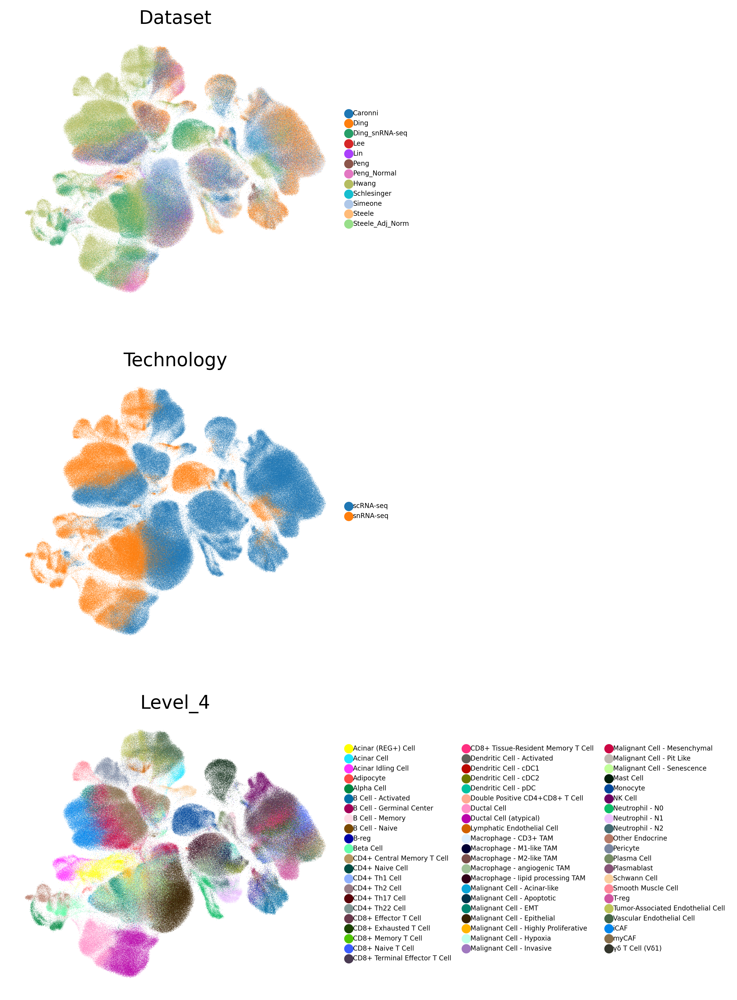

In [22]:
sc.pl.umap(adata_updated, color=['Dataset', 'Technology', 'Level_4'], frameon=False, legend_fontsize=5, ncols=1)

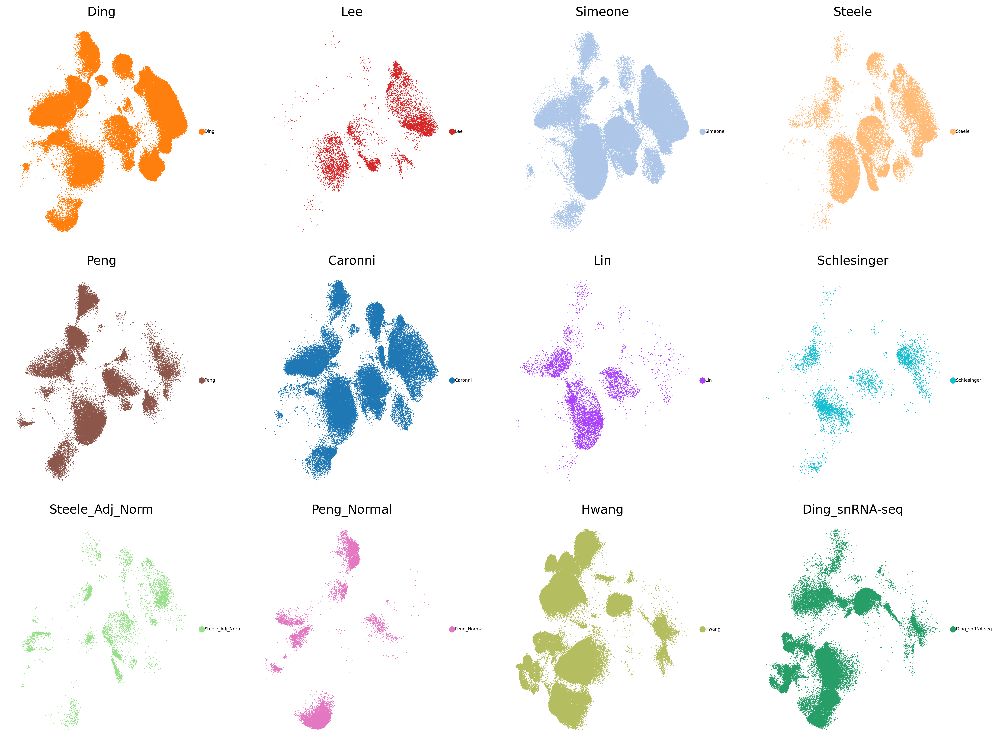

In [23]:
import math
import matplotlib.pyplot as plt

# Get unique datasets
datasets = adata_updated.obs['Dataset'].unique()
n = len(datasets)

# Define subplot grid size
ncols = 4
nrows = math.ceil(n / ncols)

# Create figure and axes
fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 4*nrows))
axes = axes.flatten()  # Flatten in case it's 2D

# Loop through each dataset and plot on its axis
for i, dataset in enumerate(datasets):
    ax = axes[i]
    sc.pl.umap(
        adata_updated[adata_updated.obs['Dataset'] == dataset],
        color='Dataset',
        frameon=False,
        legend_fontsize=5,
        size=3,
        show=False,
        ax=ax,
        title=str(dataset)
    )

# Turn off any extra axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# Get unique datasets
cell_types = sorted(adata_updated.obs['Level_4'].unique())
n = len(cell_types)

# Define subplot grid size
ncols = 4
nrows = math.ceil(n / ncols)

# Create figure and axes
fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows))
axes = axes.flatten()  

# Loop through each dataset and plot on its axis
for i, cell_type in enumerate(cell_types):
    ax = axes[i]
    sc.pl.umap(
        adata_updated,
        color='Level_4',
        groups=cell_type,
        frameon=False,
        legend_fontsize=5,
        size=3,
        show=False,
        ax=ax,
        title=str(cell_type)
    )

# Turn off any extra axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
pwd